In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

2025-06-05 09:50:50.716419: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
from vae import (
    VAE_CNN,
    TIME_VAE,
    VAEMonitor,
)

In [3]:
from data_utils import (
    load_data,
    prepare_mts_s_data,
    reconstruct_synthetic_consecutive,
    plot_feature_tsne,
    plot_real_vs_fake,
    plot_vae_losses,
    plot_vae_training_metrics,
)

In [4]:
latent_dim = 8
hidden_sizes = [50, 100, 200]  # Encoder/Decoder hidden layers
reconstruction_wt = 3.0
BATCH_SIZE = 16
seq_len = 24  # Should match your sequence length
feat_dim = 21    # Number of features (countries)


In [5]:
df_2 = load_data("data/price_subsampled_2_percent.csv")
scaler_2, (X_train_vae, P_train_vae), (X_test_vae, P_test_vae) = prepare_mts_s_data(df_2, window_size=24, test_size=0.2)

In [7]:
# Training configuration
timevae = TIME_VAE(
    seq_len=24,  # Your sequence length
    feat_dim=21,  # Number of features (countries)
    hidden_layer_sizes=[50, 100, 200],
    latent_dim=8,
    reconstruction_wt=3.0,
    trend_poly=2,  # Degree of the trend polynomial
    custom_seas=[(7, 24)]  # Seasonal periods and harmonics
)


In [9]:
timevae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))

In [10]:
# Train with monitoring
monitor = VAEMonitor(X_test_vae, freq=5)

In [11]:
# Train model with metrics
timevae_history = timevae.fit(
    X_train_vae,
    epochs=1000,
    batch_size=BATCH_SIZE,
    callbacks=[
        monitor
    ]
)

Epoch 1/1000
34/34 [==============================] - 4s 7ms/step - total_loss: 3879.8726 - recon_loss: 1265.3674 - kl_loss: 83.7703
Epoch 2/1000
34/34 [==============================] - 0s 7ms/step - total_loss: 815.0556 - recon_loss: 202.1330 - kl_loss: 208.6564
Epoch 3/1000
34/34 [==============================] - 0s 7ms/step - total_loss: 693.6360 - recon_loss: 162.4200 - kl_loss: 206.3759
Epoch 4/1000
34/34 [==============================] - 0s 6ms/step - total_loss: 625.4330 - recon_loss: 139.2053 - kl_loss: 207.8172
Epoch 5/1000
4/4 [==============================] - 1s 3ms/step total_loss: 618.9733 - recon_loss: 135.4964 - kl_loss: 212.48

Epoch 5 Metrics:
FID: 0.02
Temporal Correlation Score: 0.0228
34/34 [==============================] - 1s 38ms/step - total_loss: 600.1306 - recon_loss: 131.6046 - kl_loss: 205.3167
Epoch 6/1000
34/34 [==============================] - 0s 7ms/step - total_loss: 570.1081 - recon_loss: 125.1386 - kl_loss: 194.6923
Epoch 7/1000
34/34 [==========

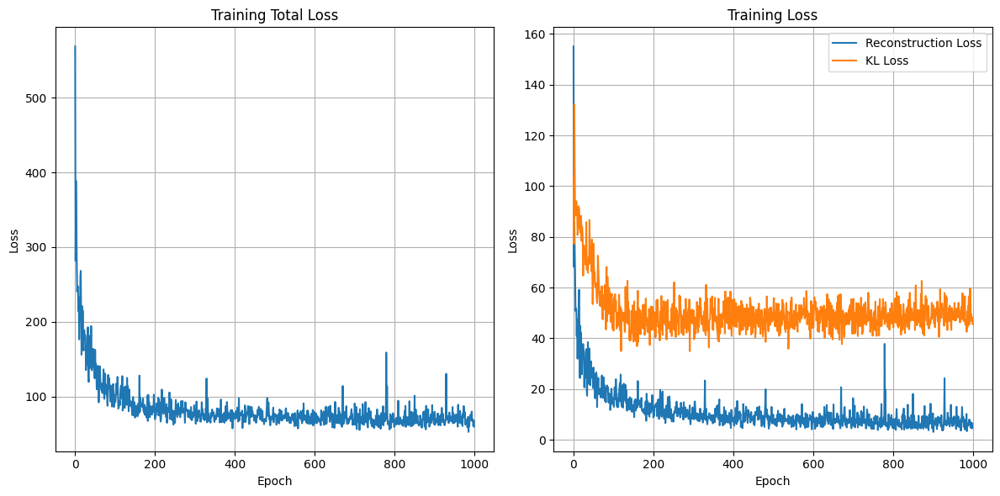

In [28]:
plot_vae_losses(timevae_history)

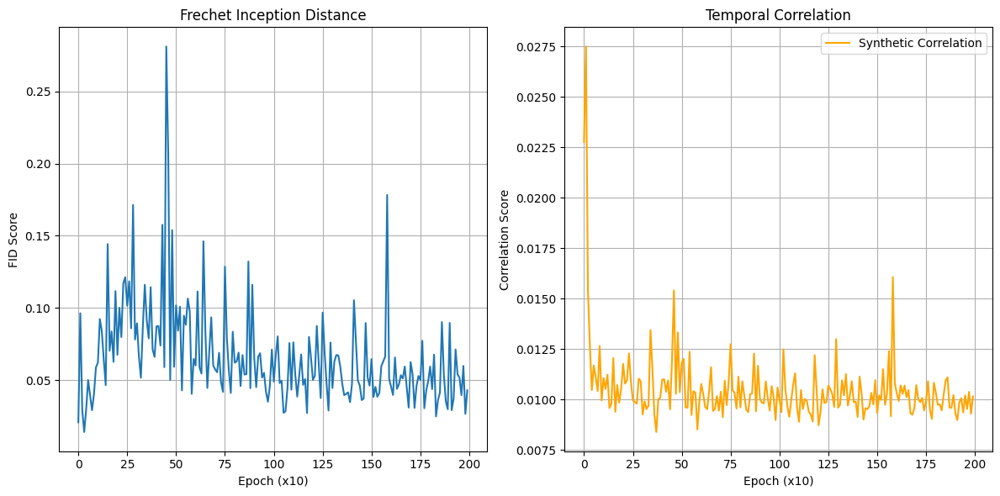

In [29]:
plot_vae_training_metrics(monitor)

In [ ]:
# Final model save
timevae.save("vae/training/models/timevae2/timevae_price_2_model.keras")

In [14]:
timevae_Z = np.random.randn(len(X_train_vae), 8)
timevae_synthetic = timevae.decoder.predict(timevae_Z, verbose=0)

In [15]:
country_names = df_2.columns.tolist()[1:] 


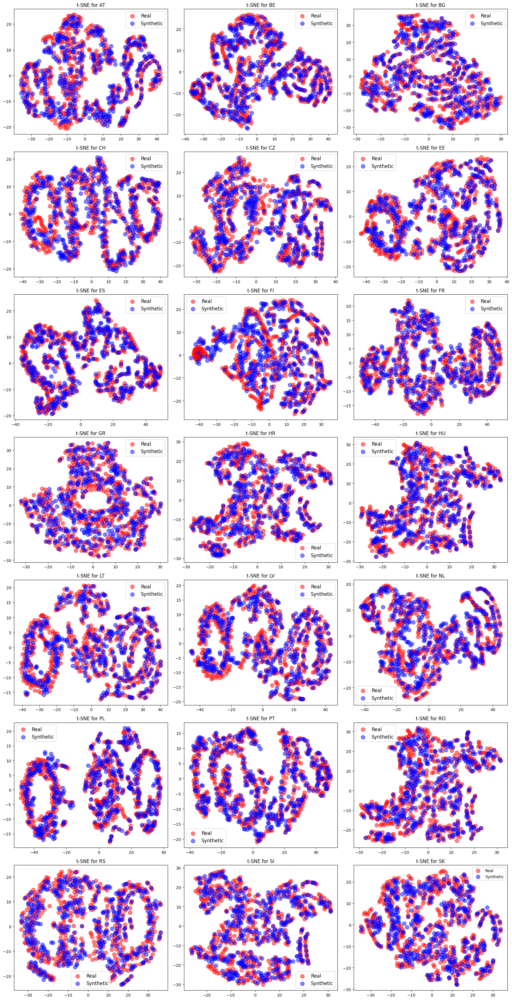

In [16]:
plot_feature_tsne(X_train_vae, timevae_synthetic, country_names)

In [17]:
reconstructed_timevae_synthetic_consecutive = reconstruct_synthetic_consecutive(
    scaler_2,
    timevae_synthetic, 
    P_train_vae
)


In [18]:
reconstructed_timevae_real_consecutive = reconstruct_synthetic_consecutive(
    scaler_2,
    X_train_vae, 
    P_train_vae
)

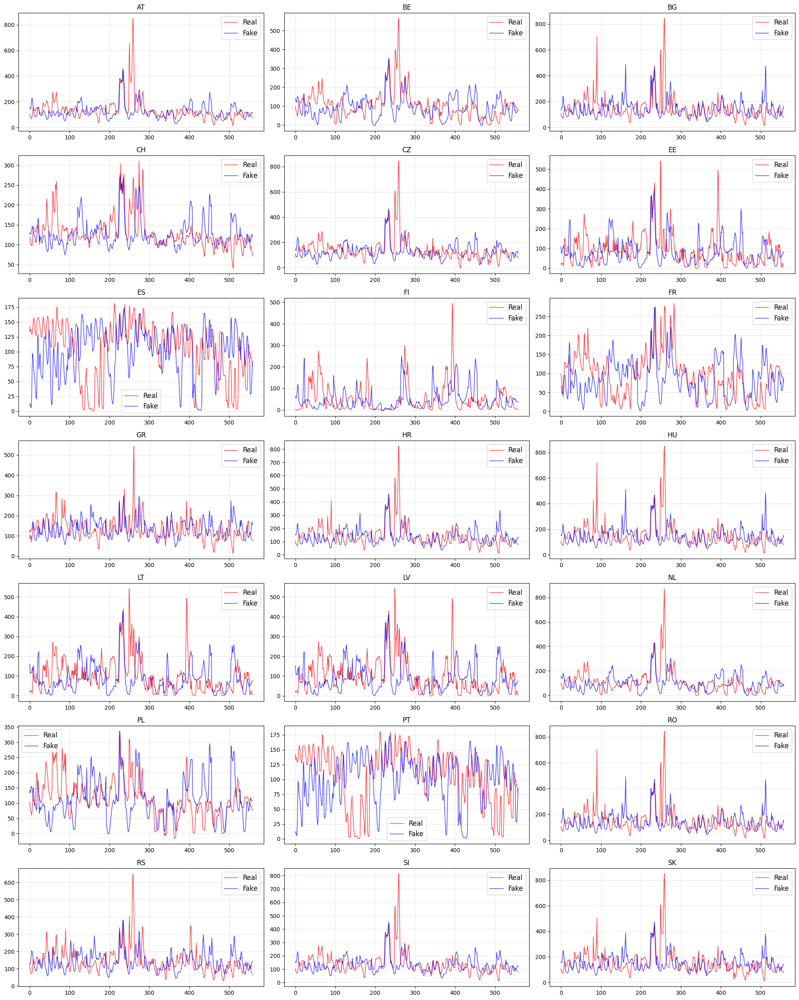

In [20]:
plot_real_vs_fake(reconstructed_timevae_real_consecutive, reconstructed_timevae_synthetic_consecutive, column_names=country_names)

In [6]:
# Training configuration
vae = VAE_CNN(
    seq_len=24,  # Your sequence length
    feat_dim=21,  # Number of features (countries)
    hidden_layer_sizes=[50, 100, 200],
    latent_dim=8,
    reconstruction_wt=3.0
)


In [7]:
vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))

In [9]:
# Train with monitoring
monitor_vae = VAEMonitor(X_test_vae, freq=5)

In [10]:
# Train model with metrics
vae_history = vae.fit(
    X_train_vae,
    epochs=1000,
    batch_size=BATCH_SIZE,
    callbacks=[
        monitor_vae
    ]
)

Epoch 1/1000
34/34 [==============================] - 3s 6ms/step - total_loss: 1165.2567 - recon_loss: 384.7607 - kl_loss: 10.9746
Epoch 2/1000
34/34 [==============================] - 0s 10ms/step - total_loss: 544.9507 - recon_loss: 181.6018 - kl_loss: 0.1452
Epoch 3/1000
34/34 [==============================] - 0s 8ms/step - total_loss: 509.5440 - recon_loss: 168.0362 - kl_loss: 5.4355
Epoch 4/1000
34/34 [==============================] - 0s 7ms/step - total_loss: 476.7854 - recon_loss: 152.9349 - kl_loss: 17.9806
Epoch 5/1000
4/4 [==============================] - 0s 3ms/step total_loss: 468.6745 - recon_loss: 150.7408 - kl_loss: 16.45

Epoch 5 Metrics:
FID: 0.26
Temporal Correlation Score: 0.0770
34/34 [==============================] - 1s 28ms/step - total_loss: 463.5789 - recon_loss: 149.0366 - kl_loss: 16.4691
Epoch 6/1000
34/34 [==============================] - 0s 5ms/step - total_loss: 453.7290 - recon_loss: 144.7707 - kl_loss: 19.4168
Epoch 7/1000
34/34 [==================

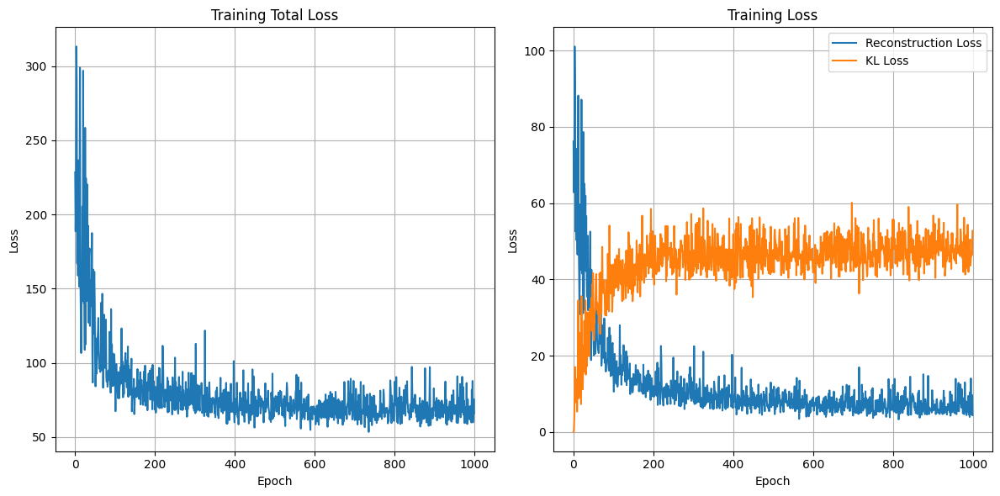

In [11]:
plot_vae_losses(vae_history)

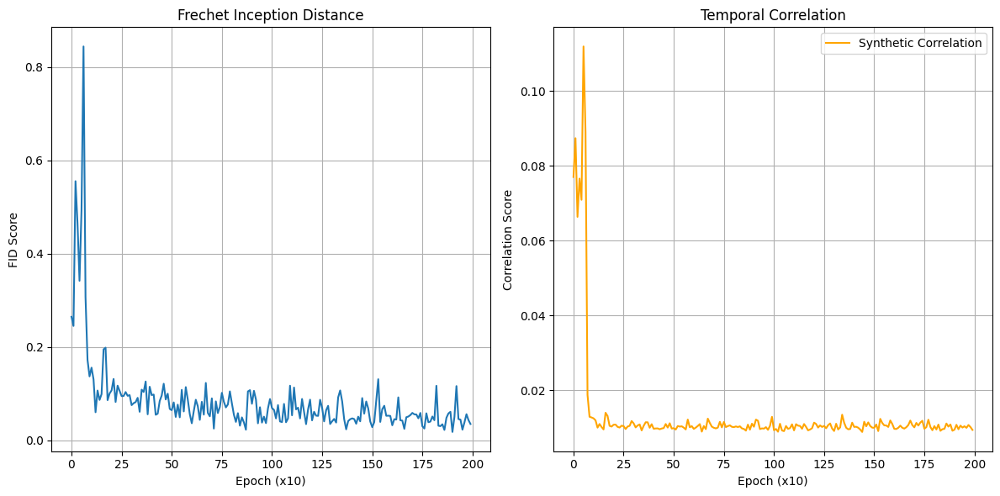

In [12]:
plot_vae_training_metrics(monitor_vae)

In [ ]:
# Final model save
vae.save("vae/training/models/vae/vae_price_2_model.keras")

In [13]:
vae_Z = np.random.randn(len(X_train_vae), 8)
vae_synthetic = vae.decoder.predict(vae_Z, verbose=0)

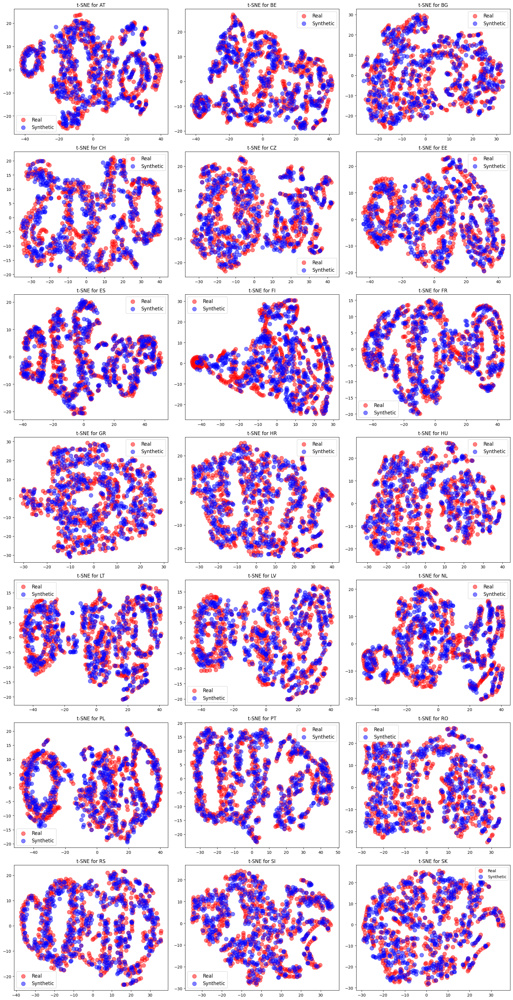

In [16]:
plot_feature_tsne(X_train_vae, vae_synthetic, country_names)

In [17]:
reconstructed_vae_synthetic_consecutive = reconstruct_synthetic_consecutive(
    scaler_2,
    vae_synthetic, 
    P_train_vae
)


In [18]:
reconstructed_vae_real_consecutive = reconstruct_synthetic_consecutive(
    scaler_2,
    X_train_vae, 
    P_train_vae
)

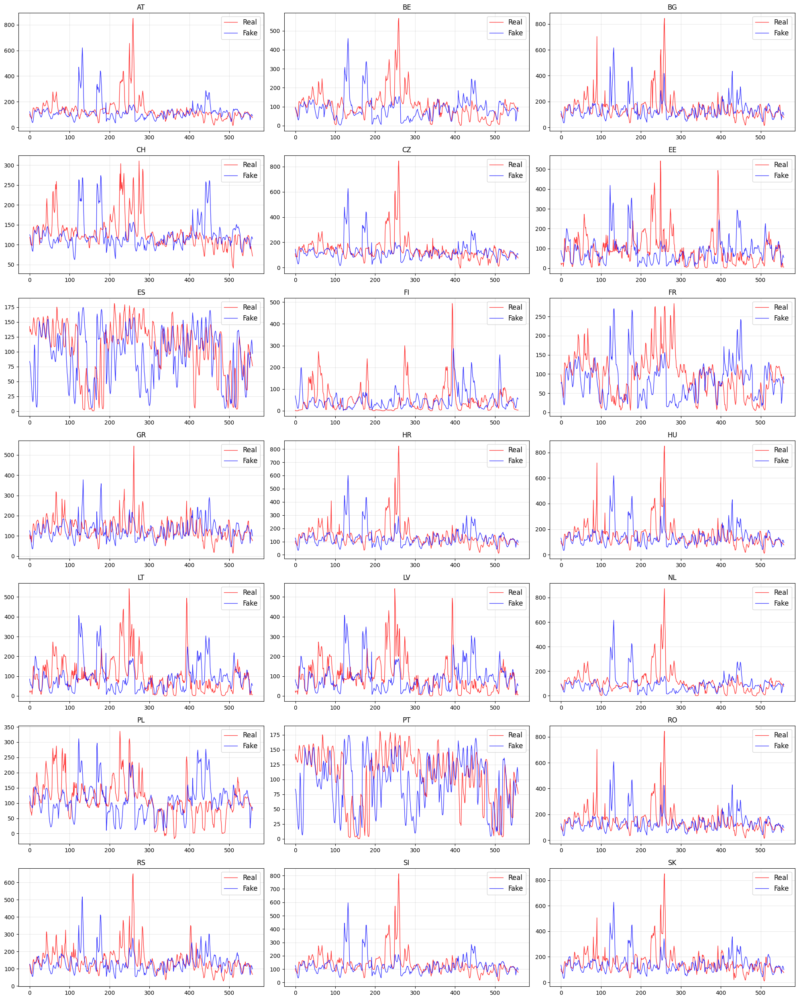

In [19]:
plot_real_vs_fake(reconstructed_vae_real_consecutive, reconstructed_vae_synthetic_consecutive, column_names=country_names)